**Mask-RCNN para detección de tumores cerebrales en imágenes de resonancia magnética.**


**Grupo Cerebro**: Gonzalo Bello & Simón Sánchez

Julio 2024

In [ ]:
!pip uninstall tensorflow keras tf-keras -y

Found existing installation: tensorflow 2.17.0
Uninstalling tensorflow-2.17.0:
  Successfully uninstalled tensorflow-2.17.0
Found existing installation: keras 3.4.1
Uninstalling keras-3.4.1:
  Successfully uninstalled keras-3.4.1
Found existing installation: tf_keras 2.17.0
Uninstalling tf_keras-2.17.0:
  Successfully uninstalled tf_keras-2.17.0


In [ ]:
!pip install tensorflow==2.15.0 keras==2.15.0 tf-keras==2.15.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 43.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 27.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 34.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 5.2 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.0
    Uninstalling ml-dtypes-0.4.0:
      Successfully uninstalled ml-dtypes-0.4.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.0
    Uninstalling tensorboard-2.17.0:
      Success

In [ ]:
pip install --upgrade ml-dtypes

  Using cached ml_dtypes-0.4.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
Using cached ml_dtypes-0.4.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.2 MB)
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires ml-dtypes~=0.2.0, but you have ml-dtypes 0.4.0 which is incompatible.


In [ ]:
import tensorflow as tf

print("tensorflow version:", tf.__version__)

tensorflow version: 2.15.0


In [ ]:
pip show tf-keras

Name: tf-keras
Version: 2.15.0
Summary: Deep learning for humans.
Home-page: https://keras.io/
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: 
Required-by: tensorflow-hub


In [ ]:
import keras
print("Keras version:", keras.__version__)

Keras version: 2.15.0


In [ ]:
# Para saber si estás trabajando con GPU o no

# import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# Cambiar al directorio de trabajo
original_dir = '/content/drive/My Drive/proyecto_dl'
mask_rcnn_dir = os.path.join(original_dir, 'mask-rcnn')
os.chdir(mask_rcnn_dir)

import numpy as np
import json
import skimage.draw
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, TensorBoard
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize

In [ ]:
import sys
# Directorio raíz del proyecto
ROOT_DIR = os.path.abspath('.')
print(f"Directorio raíz del proyecto: {ROOT_DIR}")

# Importar Mask RCNN
sys.path.append(ROOT_DIR)

# Importar configuración COCO
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
import coco

plt.rcParams['figure.facecolor'] = 'white'

# Volver al directorio original
os.chdir(original_dir)
print(os.getcwd())

Directorio raíz del proyecto: /content/drive/My Drive/proyecto_dl/mask-rcnn
/content/drive/My Drive/proyecto_dl


In [ ]:
class TumorConfig(Config):
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1

    STEPS_PER_EPOCH = 100
    LEARNING_RATE = 0.001

config = TumorConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        35
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  1024
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [ ]:
class BrainScanDataset(utils.Dataset):

    def load_brain_scan(self, dataset_dir, subset):
        """Load a subset of the dataset."""
        self.add_class("tumor", 1, "tumor")

        assert subset in ["train", "val", "test"]
        dataset_dir = os.path.join(dataset_dir, subset)

        annotations_path = os.path.join(dataset_dir, f'annotations_{subset}.json')
        try:
            with open(annotations_path) as f:
                annotations = json.load(f)
        except FileNotFoundError:
            raise FileNotFoundError(f"Annotations file not found: {annotations_path}")
        except json.JSONDecodeError:
            raise ValueError(f"Error decoding JSON from the file: {annotations_path}")

        annotations = list(annotations.values())
        annotations = [a for a in annotations if a['regions']]

        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]

            image_path = os.path.join(dataset_dir, a['filename'])
            try:
                image = skimage.io.imread(image_path)
            except FileNotFoundError:
                print(f"Warning: Image file not found: {image_path}")
                continue
            except Exception as e:
                print(f"Warning: Error reading image file {image_path}: {e}")
                continue

            height, width = image.shape[:2]

            self.add_image(
                "tumor",
                image_id=a['filename'],
                path=image_path,
                width=width,
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        """Generate instance masks for an image."""
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)

        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])], dtype=np.uint8)

        for i, p in enumerate(info["polygons"]):
            all_points_y = np.array(p['all_points_y'])
            all_points_x = np.array(p['all_points_x'])

            # Validate coordinates
            all_points_y = np.clip(all_points_y, 0, info["height"] - 1)
            all_points_x = np.clip(all_points_x, 0, info["width"] - 1)

            rr, cc = skimage.draw.polygon(all_points_y, all_points_x)
            mask[rr, cc, i] = 1

        # Utilize the function from utils to convert mask to boolean
        return mask.astype(np.bool_), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            return super(self.__class__, self).image_reference(image_id)

In [ ]:
# Crear los datasets
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan('brain-tumor/data_cleaned', 'train')
dataset_train.prepare()

dataset_val = BrainScanDataset()
dataset_val.load_brain_scan('brain-tumor/data_cleaned', 'val')
dataset_val.prepare()

dataset_test = BrainScanDataset()
dataset_test.load_brain_scan('brain-tumor/data_cleaned', 'test')
dataset_test.prepare()

In [ ]:
# Crear el directorio para guardar checkpoints
CHECKPOINT_DIR = os.path.abspath('./brain-tumor/checkpoints')

In [ ]:
# os.makedirs(CHECKPOINT_DIR, exist_ok=True)
# os.makedirs('./brain-tumor/logs', exist_ok=True)

In [ ]:
# # Configuración de callbacks
# tensorboard_callback = TensorBoard(log_dir='./brain-tumor/logs', histogram_freq=0)
# checkpoint_callback = ModelCheckpoint(filepath=os.path.join(CHECKPOINT_DIR, 'weights.{epoch:02d}-{val_loss:.2f}.h5'), save_weights_only=True)
# reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)
# early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10)

# # Lista de callbacks
# callbacks = [tensorboard_callback, checkpoint_callback, reduce_lr_callback, early_stopping_callback]

In [ ]:
# # Configurar el modelo para entrenamiento
# model = modellib.MaskRCNN(
#     mode='training',
#     config=config,
#     model_dir=CHECKPOINT_DIR
# )

# model.load_weights(
#     os.path.join(ROOT_DIR, "mask_rcnn_coco.h5"),
#     by_name=True,
#     exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
# )

In [ ]:
# # Entrenar el modelo por 30 época
# num_epochs = 30

In [ ]:
# model.train(
#     dataset_train,
#     dataset_val,
#     learning_rate=config.LEARNING_RATE,
#     epochs=num_epochs,
#     layers='all',
#     custom_callbacks=callbacks
# )


Starting at epoch 0. LR=0.001

Checkpoint Path: /content/drive/MyDrive/proyecto_dl/brain-tumor/checkpoints/tumor_detector20240712T0056/mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (Batch

/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/legacy/gradient_descent.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/30
  1/100 [..............................] - ETA: 54:15 - batch: 0.0000e+00 - size: 1.0000 - loss: 3.4775 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 3.1673 - mrcnn_class_loss: 0.2520 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

ERROR:tensorflow:Failed to start profiler: Another profiler is running.


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 1.0000 - loss: 1.4037 - rpn_class_loss: 0.0286 - rpn_bbox_loss: 0.4357 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.5077 - mrcnn_mask_loss: 0.3428

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


100/100 [==============================] - 202s 2s/step - batch: 49.5000 - size: 1.0000 - loss: 1.4037 - rpn_class_loss: 0.0286 - rpn_bbox_loss: 0.4357 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.5077 - mrcnn_mask_loss: 0.3428 - val_loss: 0.9606 - val_rpn_class_loss: 0.0145 - val_rpn_bbox_loss: 0.2860 - val_mrcnn_class_loss: 0.0449 - val_mrcnn_bbox_loss: 0.3210 - val_mrcnn_mask_loss: 0.2941 - lr: 0.0010
Epoch 2/30
100/100 [==============================] - 127s 1s/step - batch: 49.5000 - size: 1.0000 - loss: 0.9959 - rpn_class_loss: 0.0176 - rpn_bbox_loss: 0.2858 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.3135 - mrcnn_mask_loss: 0.2917 - val_loss: 0.8418 - val_rpn_class_loss: 0.0139 - val_rpn_bbox_loss: 0.2774 - val_mrcnn_class_loss: 0.0675 - val_mrcnn_bbox_loss: 0.2146 - val_mrcnn_mask_loss: 0.2684 - lr: 0.0010
Epoch 3/30
100/100 [==============================] - 127s 1s/step - batch: 49.5000 - size: 1.0000 - loss: 0.6698 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.1861 - mr

In [ ]:
import tensorflow as tf
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

# Ruta al archivo de eventos
log_file = '/content/drive/MyDrive/proyecto_dl/brain-tumor/logs/events.out.tfevents.1720745855.217270fa8122'

# Cargar los datos del archivo de eventos
event_acc = EventAccumulator(log_file)
event_acc.Reload()

# Obtener los tags de los datos
tags = event_acc.Tags()['scalars']
print("Tags disponibles:", tags)

# Función para extraer los datos de una métrica específica
def get_scalar_data(event_acc, tag):
    scalars = event_acc.Scalars(tag)
    steps = [scalar.step for scalar in scalars]
    values = [scalar.value for scalar in scalars]
    return steps, values

Tags disponibles: ['epoch_loss', 'epoch_rpn_class_loss', 'epoch_rpn_bbox_loss', 'epoch_mrcnn_class_loss', 'epoch_mrcnn_bbox_loss', 'epoch_mrcnn_mask_loss', 'epoch_val_loss', 'epoch_val_rpn_class_loss', 'epoch_val_rpn_bbox_loss', 'epoch_val_mrcnn_class_loss', 'epoch_val_mrcnn_bbox_loss', 'epoch_val_mrcnn_mask_loss']


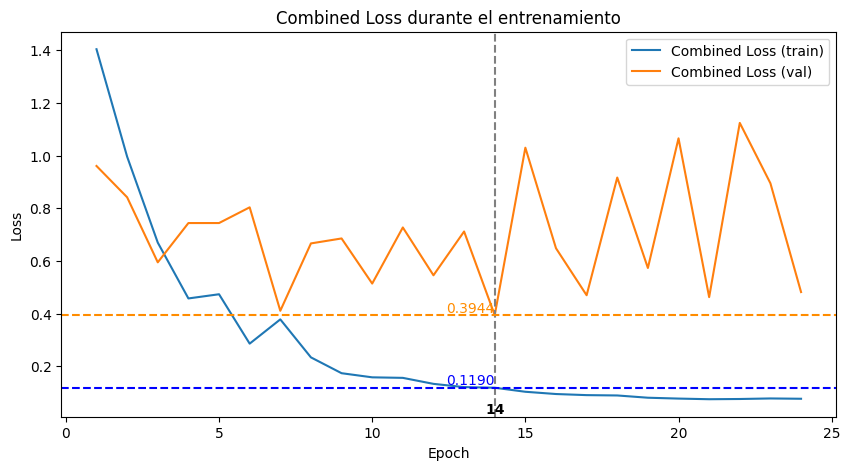

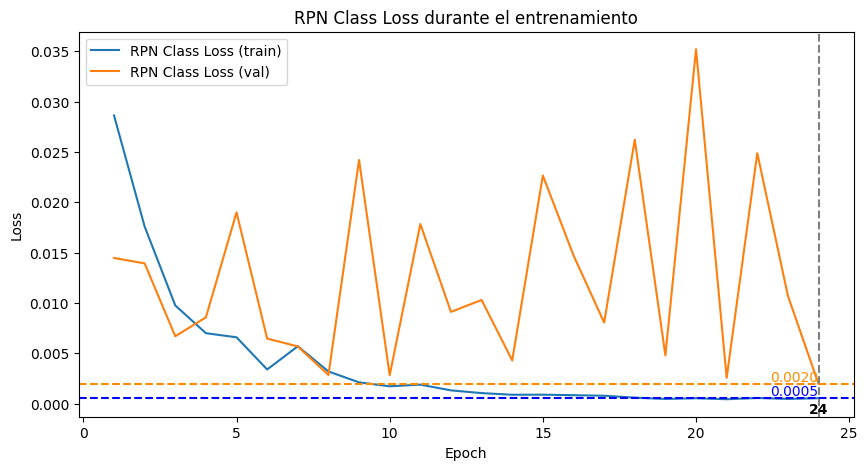

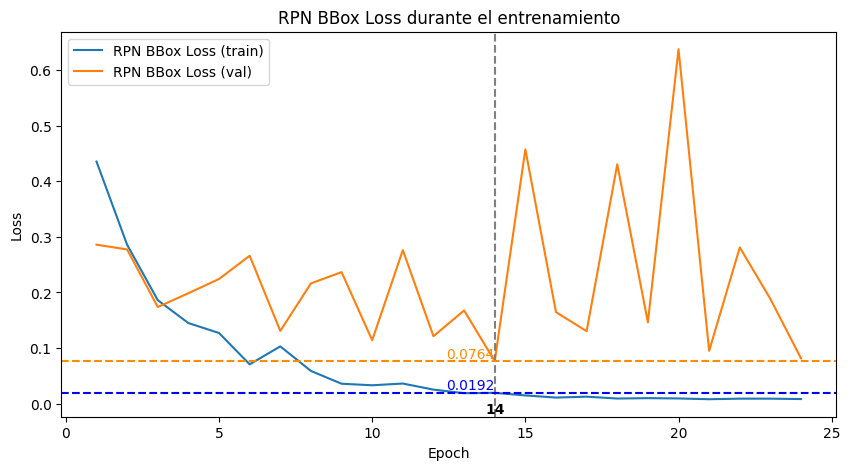

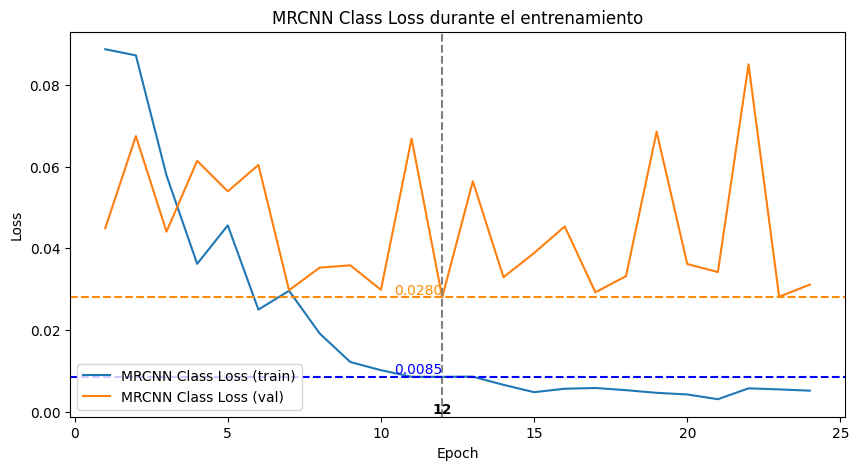

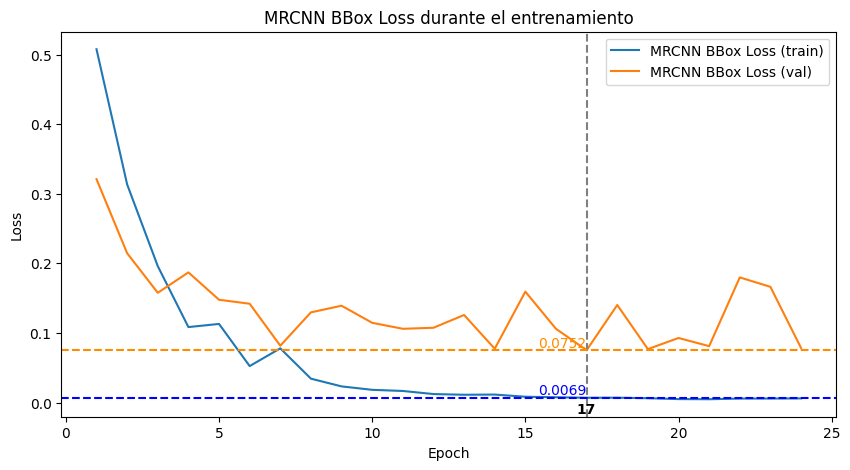

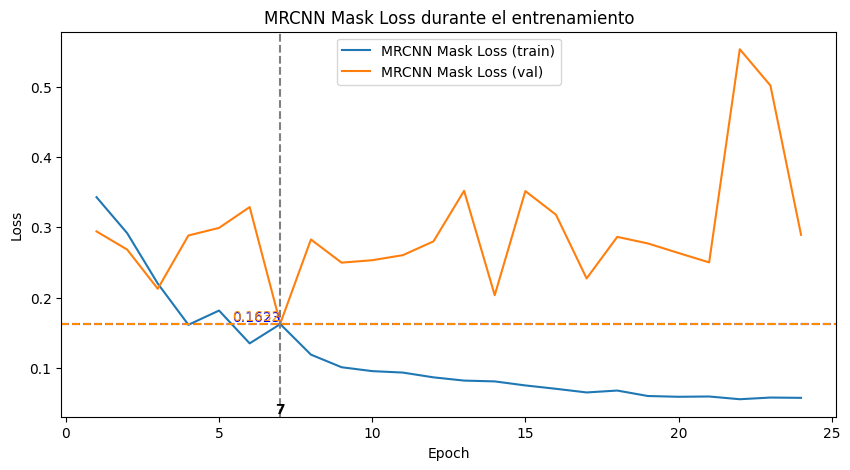

In [ ]:
# Definir una lista de pares de tags y sus títulos correspondientes
tags_pairs = [
    ('epoch_loss', 'epoch_val_loss', 'Combined Loss'),
    ('epoch_rpn_class_loss', 'epoch_val_rpn_class_loss', 'RPN Class Loss'),
    ('epoch_rpn_bbox_loss', 'epoch_val_rpn_bbox_loss', 'RPN BBox Loss'),
    ('epoch_mrcnn_class_loss', 'epoch_val_mrcnn_class_loss', 'MRCNN Class Loss'),
    ('epoch_mrcnn_bbox_loss', 'epoch_val_mrcnn_bbox_loss', 'MRCNN BBox Loss'),
    ('epoch_mrcnn_mask_loss', 'epoch_val_mrcnn_mask_loss', 'MRCNN Mask Loss')
]

# Iterar sobre los pares de tags para generar los gráficos
for train_tag, val_tag, title in tags_pairs:
    # Extraer los datos de las métricas de interés
    epoch_train_steps, epoch_train_values = get_scalar_data(event_acc, train_tag)
    epoch_val_steps, epoch_val_values = get_scalar_data(event_acc, val_tag)

    # Encuentra la época con la pérdida de validación mínima
    epoch_optimal = np.argmin(epoch_val_values)

    # Graficar la pérdida
    plt.figure(figsize=(10, 5))
    plt.plot([x + 1 for x in epoch_train_steps], epoch_train_values, label=f'{title} (train)')
    plt.plot([x + 1 for x in epoch_val_steps], epoch_val_values, label=f'{title} (val)')

    # Obtener los valores de pérdida en la época óptima
    train_loss_value = epoch_train_values[epoch_optimal]
    val_loss_value = epoch_val_values[epoch_optimal]

    # Añadir anotaciones en el gráfico en la época óptima
    plt.text(epoch_optimal + 1, train_loss_value, f'{train_loss_value:.4f}', ha='right', va='bottom', color='blue')
    plt.text(epoch_optimal + 1, val_loss_value, f'{val_loss_value:.4f}', ha='right', va='bottom', color='#FF8C00')

    # Añadir líneas punteadas que corten en el eje x (época óptima) y en el eje y (valores de pérdida)
    plt.axvline(x=epoch_optimal + 1, color='gray', linestyle='--')
    plt.axhline(y=train_loss_value, color='blue', linestyle='--')
    plt.axhline(y=val_loss_value, color='#FF8C00', linestyle='--')

    # Añadir anotación en el eje x para la época óptima
    plt.text(epoch_optimal + 1, plt.ylim()[0], f'{epoch_optimal + 1}', ha='center', va='bottom', color='black', fontsize=10, fontweight='bold')

    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title(f'{title} durante el entrenamiento')
    plt.show()
    print("\n")


In [ ]:
# Configurar el modelo para inferencia (desactivar el entrenamiento)
model = modellib.MaskRCNN(
    mode="inference",           # Modo inferencia para realizar predicciones
    config=config,              # Configuración específica para el proyecto
    model_dir=CHECKPOINT_DIR    # Directorio donde se guardan los pesos del modelo
)

# Obtener la ruta a los pesos guardados más recientes (mejor modelo entrenado)
model_path = '/content/drive/MyDrive/proyecto_dl/brain-tumor/checkpoints/weights.14-0.3944.h5'

# Cargar los pesos en el modelo utilizando solo los nombres de las capas que coinciden
model.load_weights(model_path, by_name=True)

Instructions for updating:
Use fn_output_signature instead


In [ ]:
# Definir la función para predecir y visualizar
def get_ax(rows=1, cols=1, size=16):
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

def display_image(dataset, ind):
    plt.figure(figsize=(5,5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()

def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(
        dataset, config, img_id, augmentation=None
    )

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_instances(
        original_image,
        r['rois'], r['masks'], r['class_ids'],
        dataset.class_names, r['scores'],
        ax=get_ax()
    )


# Se define funcion para ver las anotaciones reales y poder comparar
def display_real_annotations(dataset, img_id):
    # Cargar la imagen y las anotaciones reales
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(
        dataset, config, img_id)

    # Visualizar las anotaciones reales
    visualize.display_instances(
        original_image,
        gt_bbox,
        gt_mask,
        gt_class_id,
        dataset.class_names,
        scores=None,  # No scores for ground truth
        title="Ground Truth",
        ax=get_ax()
    )

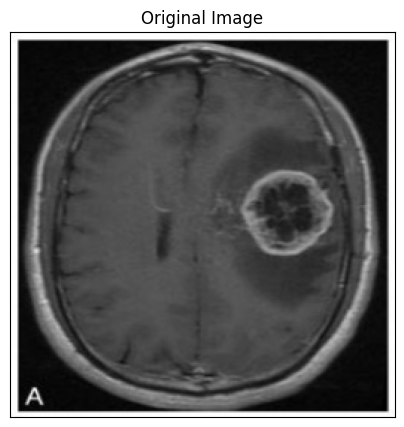

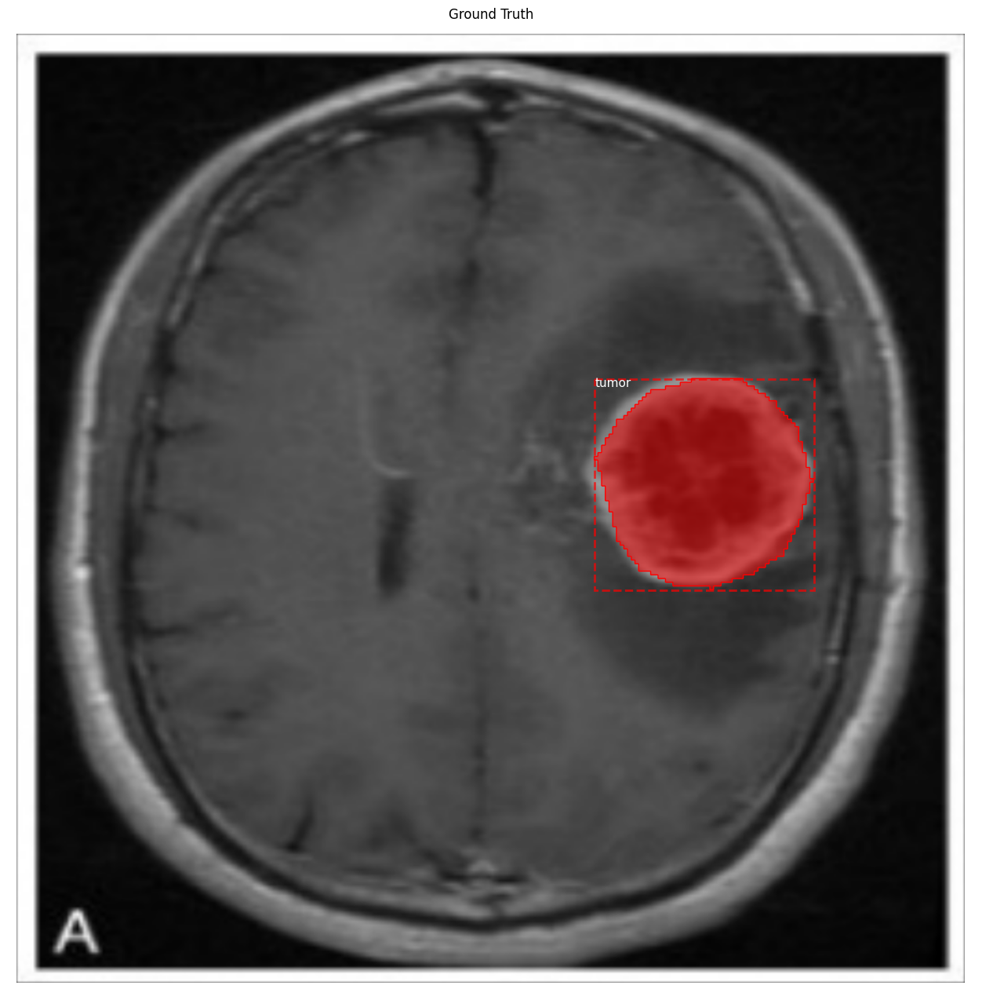

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


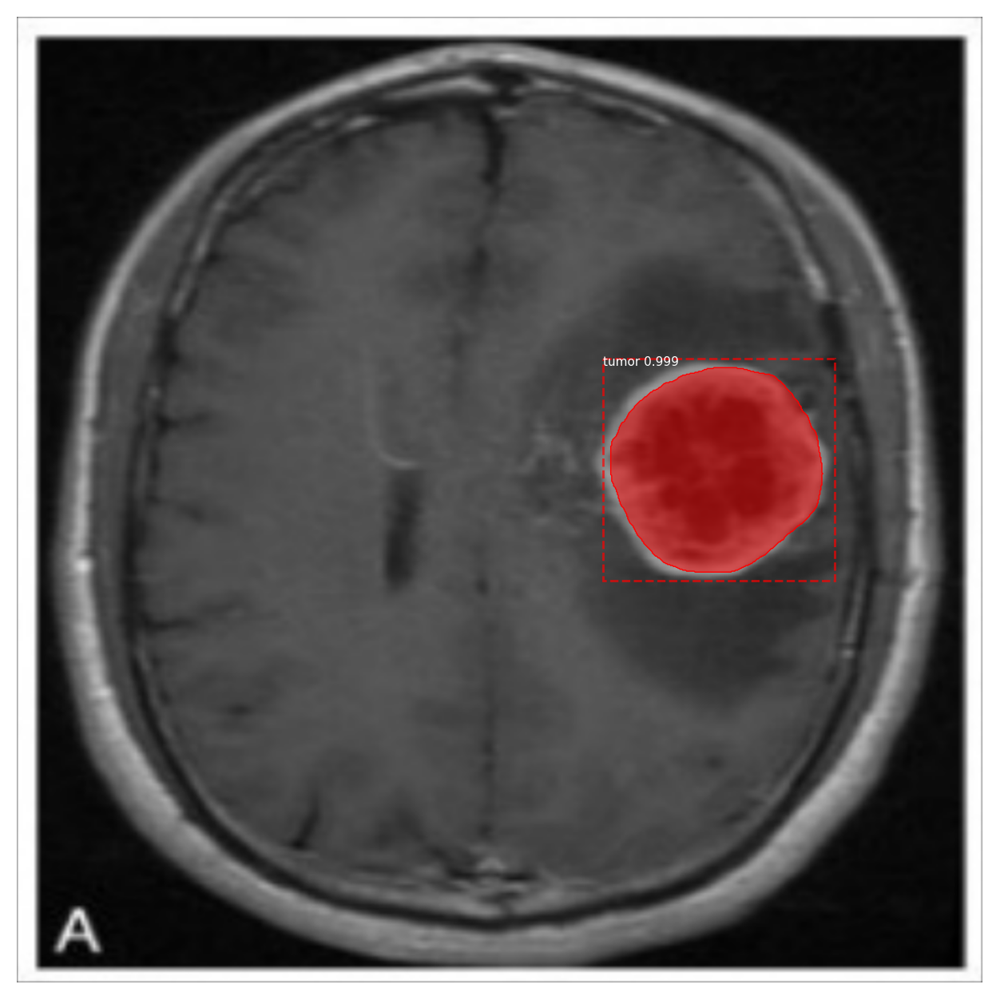

In [ ]:
# Evaluar y visualizar resultados
ind = 0 # aquí poner el número dentro del rango de las imagenes de evaluacion
display_image(dataset_test, ind)
display_real_annotations(dataset_test, ind)
predict_and_plot_differences(dataset_test, ind)

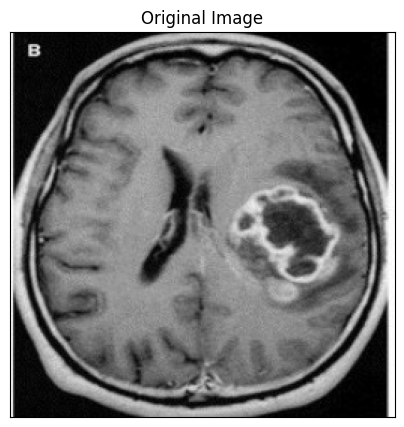

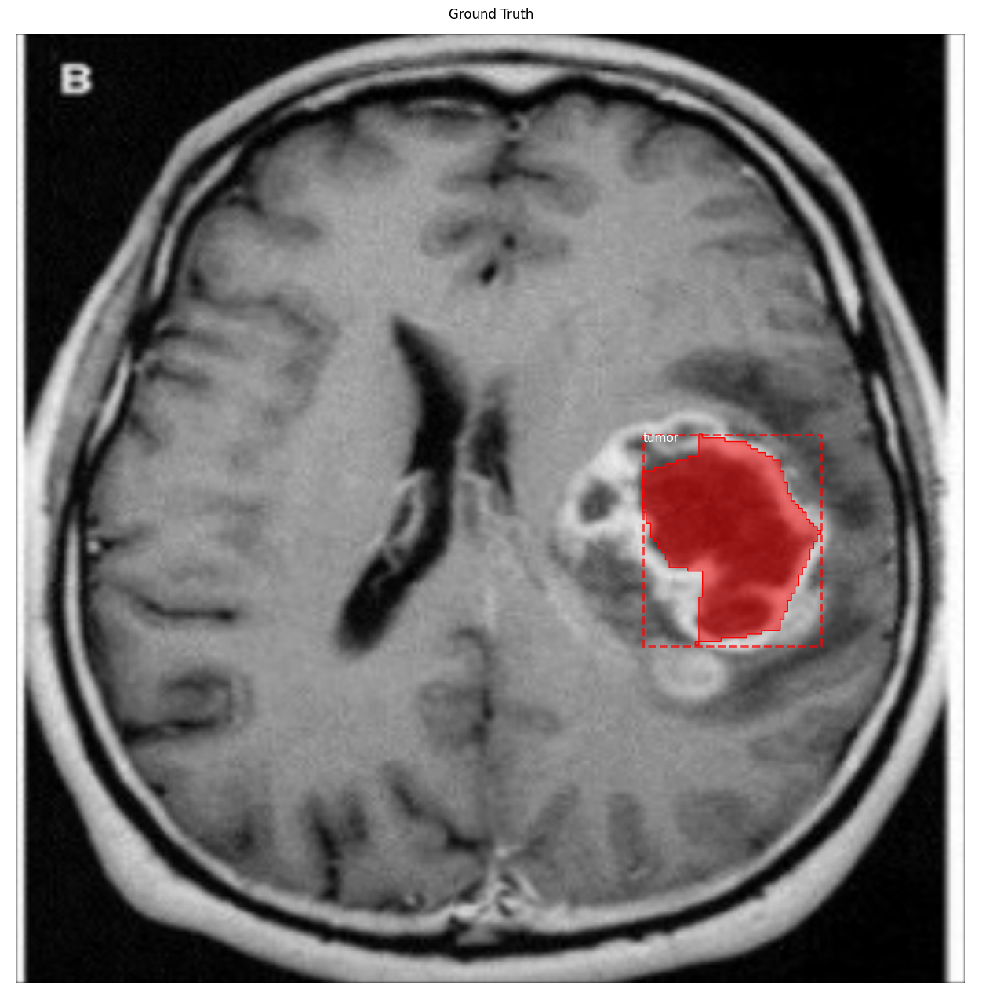

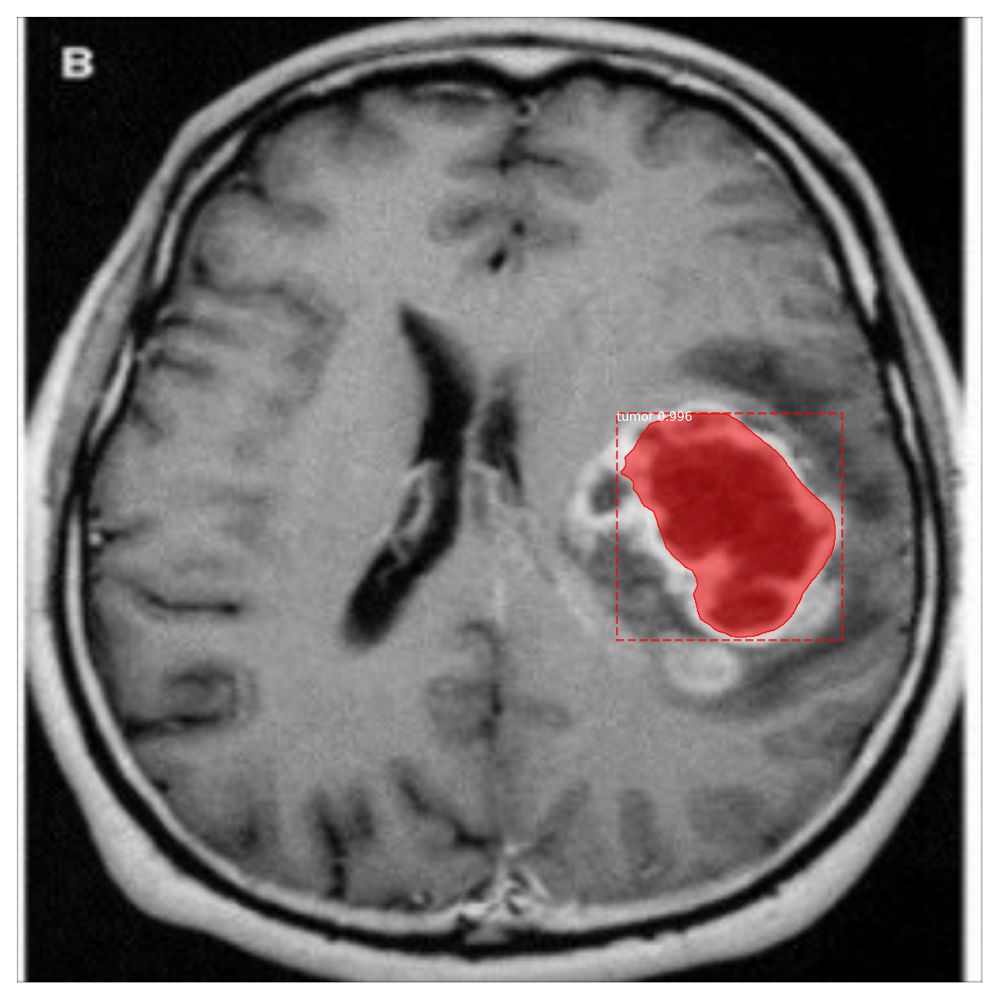

In [ ]:
# Evaluar y visualizar resultados
ind = 1 # aquí poner el número dentro del rango de las imagenes de evaluacion
display_image(dataset_test, ind)
display_real_annotations(dataset_test, ind)
predict_and_plot_differences(dataset_test, ind)

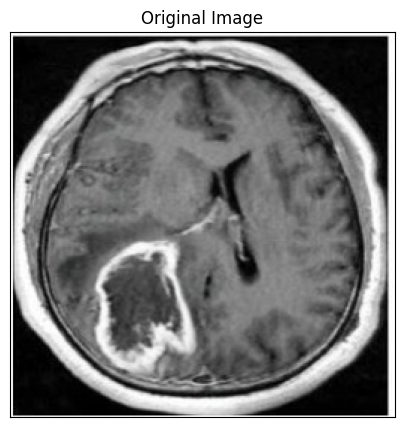

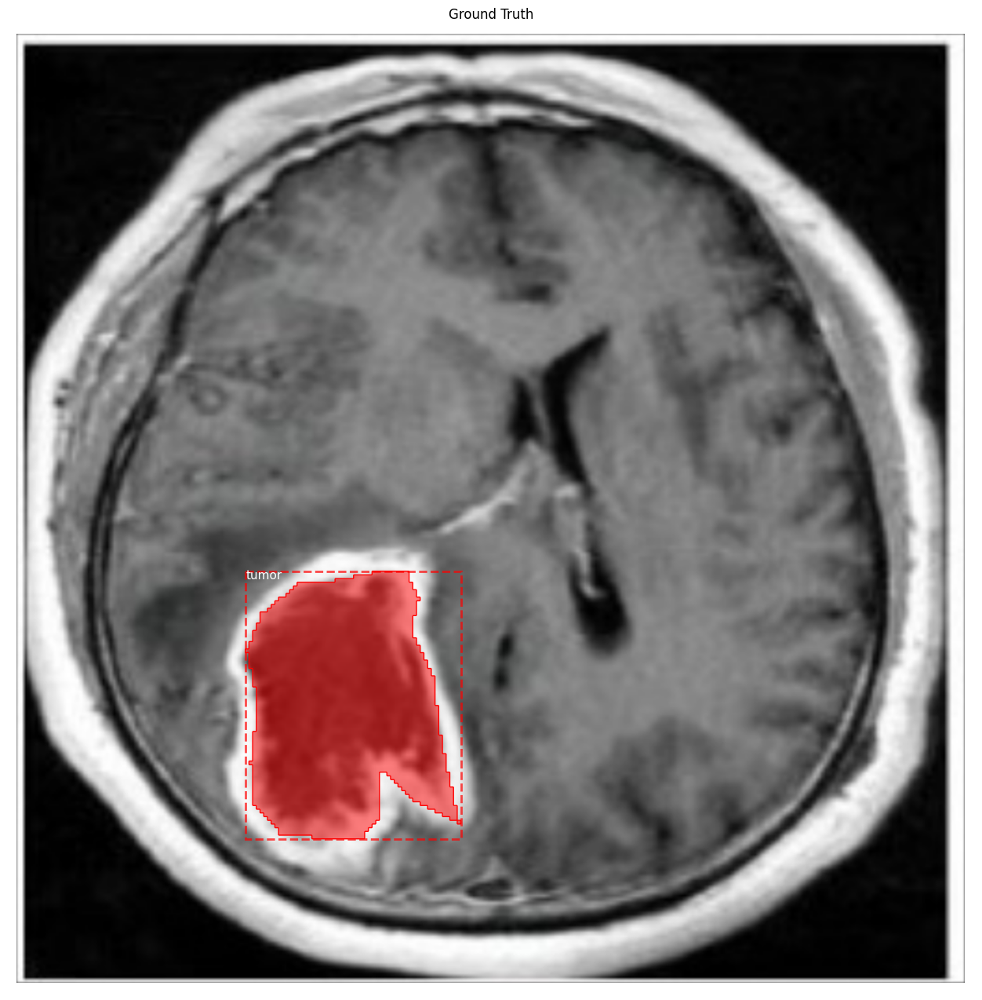

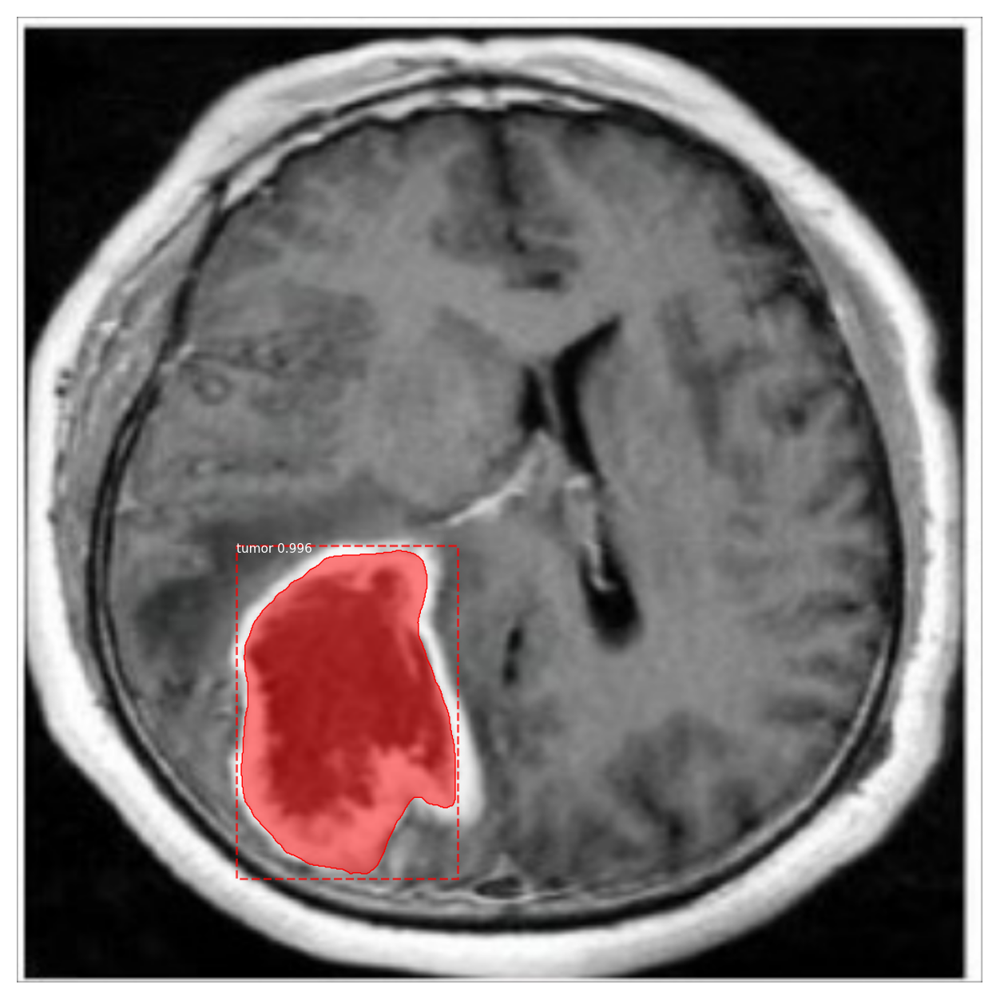

In [ ]:
# Evaluar y visualizar resultados
ind = 2 # aquí poner el número dentro del rango de las imagenes de evaluacion
display_image(dataset_test, ind)
display_real_annotations(dataset_test, ind)
predict_and_plot_differences(dataset_test, ind)

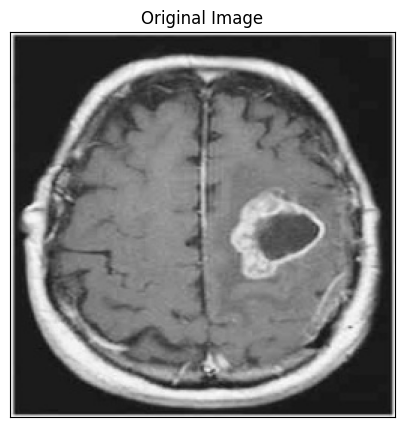

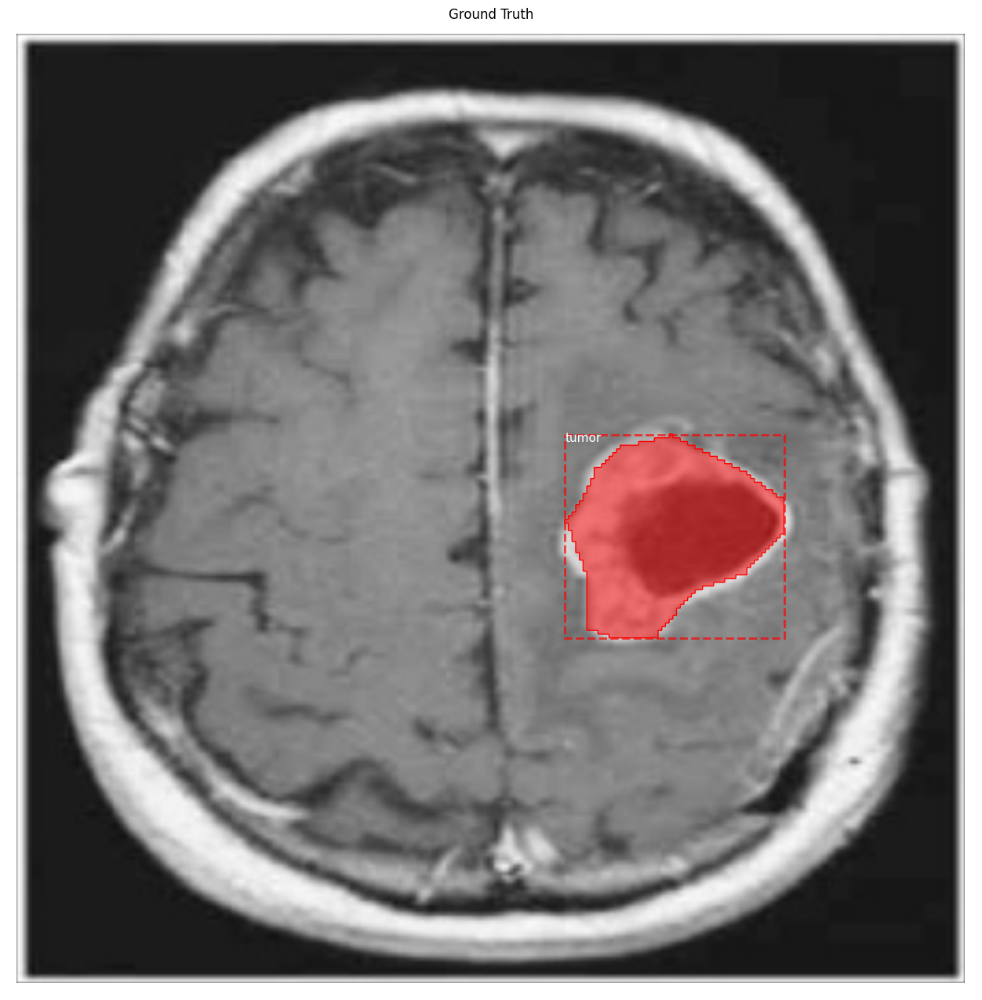

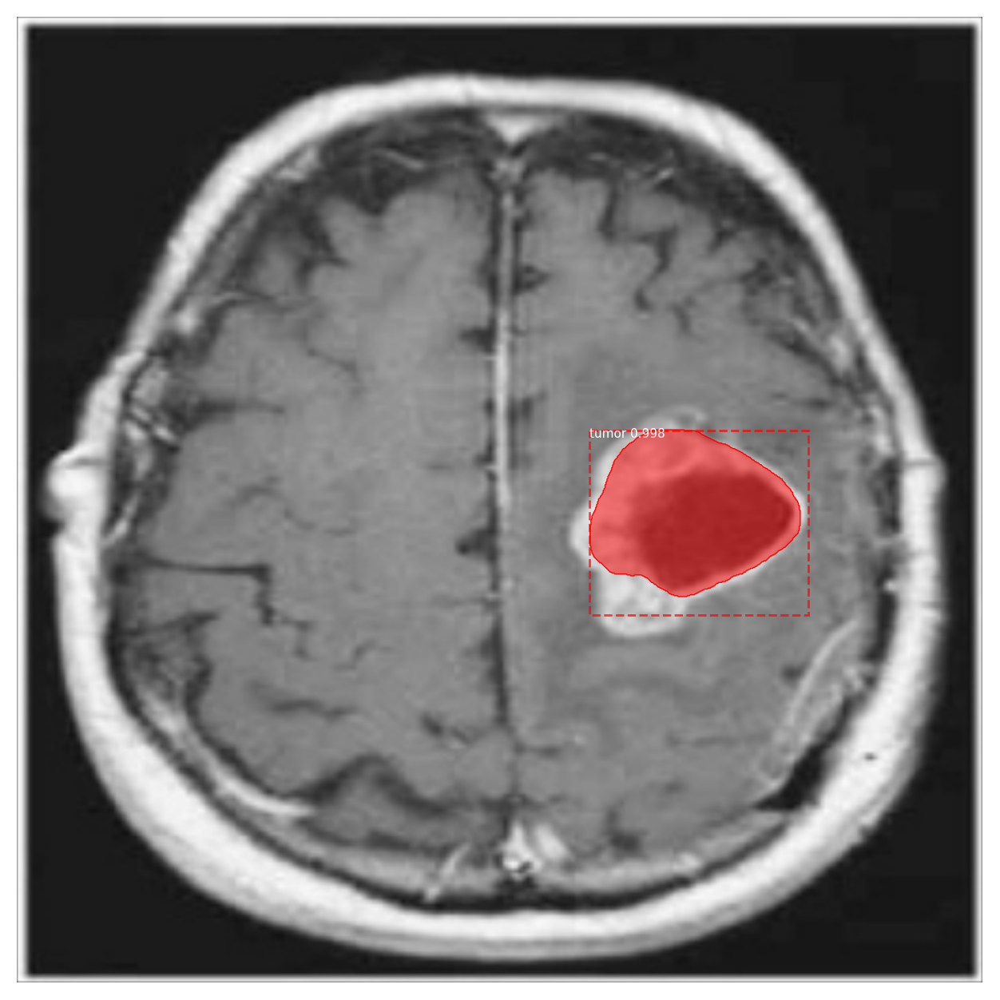

In [ ]:
# Evaluar y visualizar resultados
ind = 3 # aquí poner el número dentro del rango de las imagenes de evaluacion
display_image(dataset_test, ind)
display_real_annotations(dataset_test, ind)
predict_and_plot_differences(dataset_test, ind)

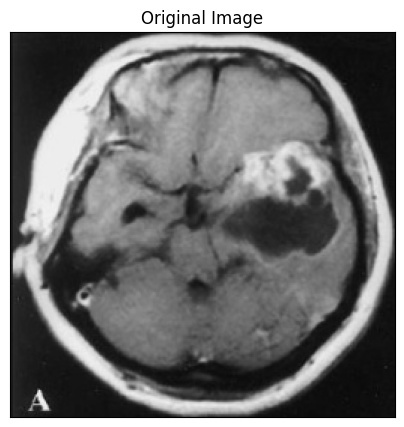

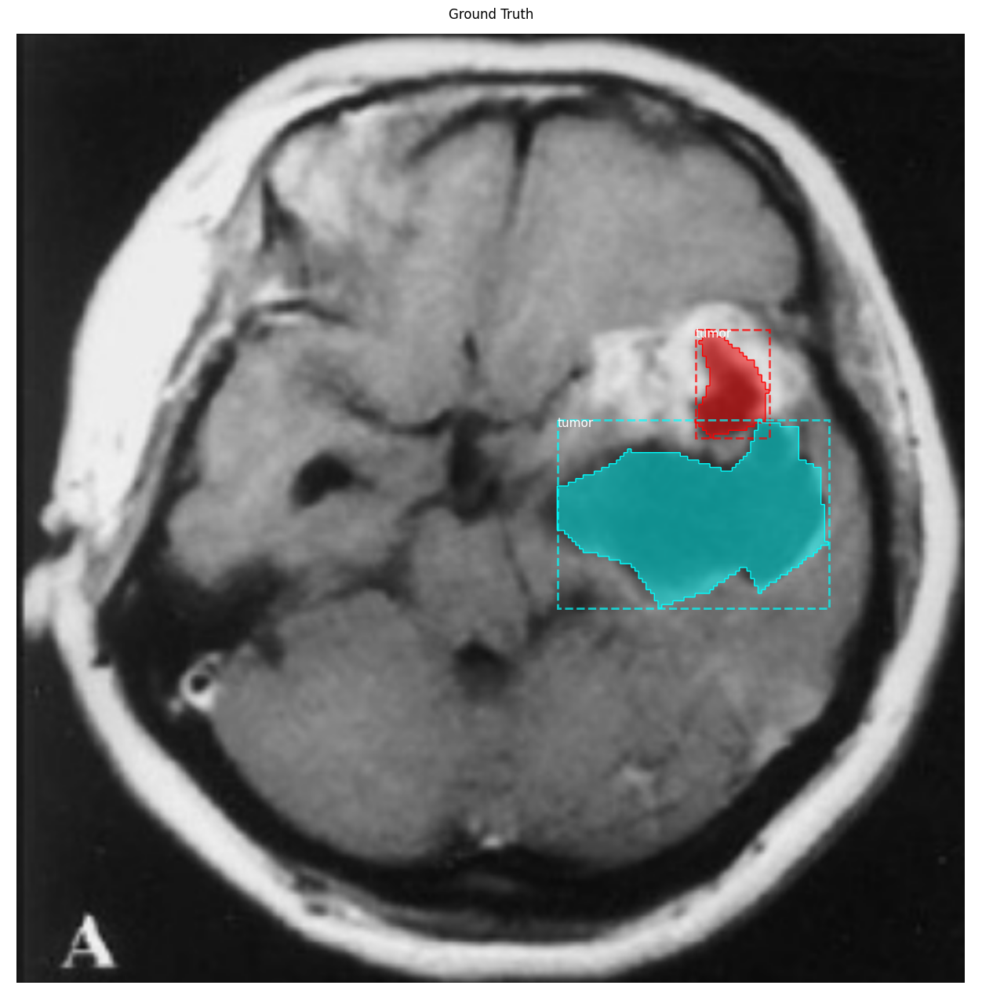

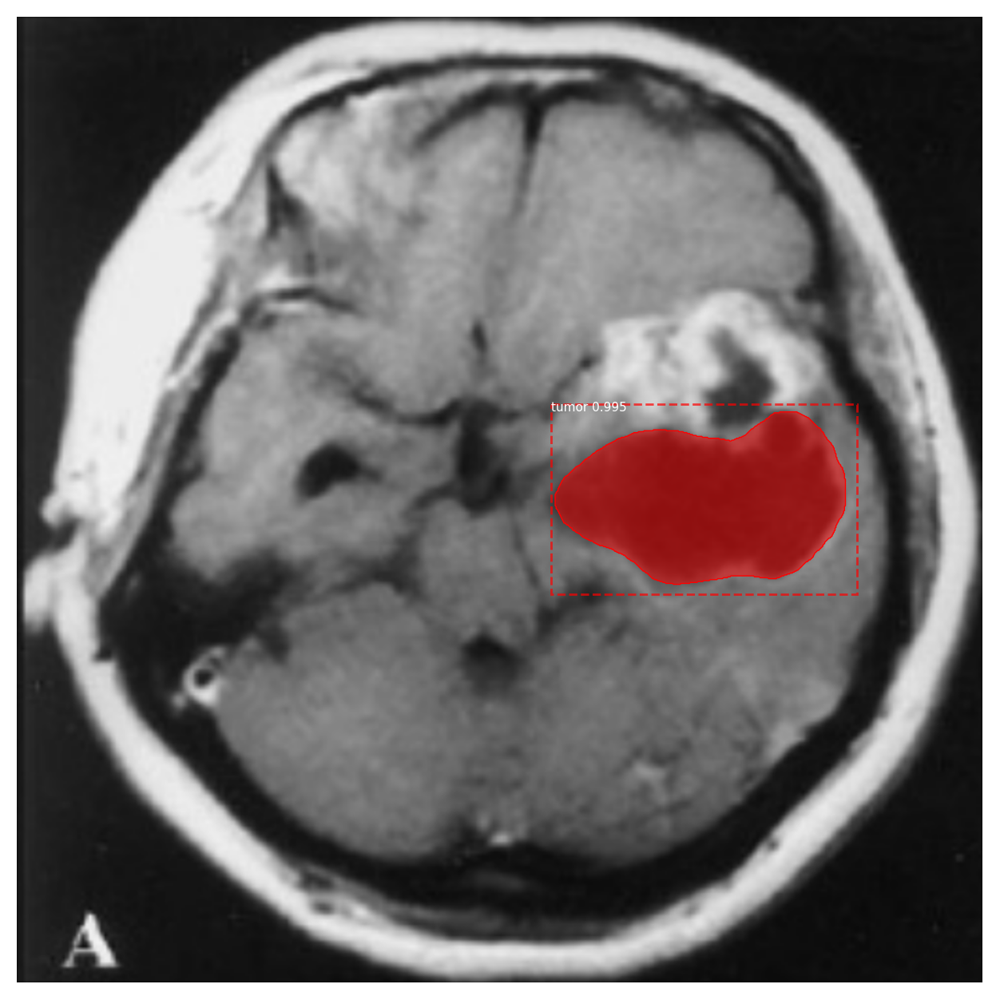

In [ ]:
# Evaluar y visualizar resultados
ind = 6 # aquí poner el número dentro del rango de las imagenes de evaluacion
display_image(dataset_val, ind)
display_real_annotations(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)

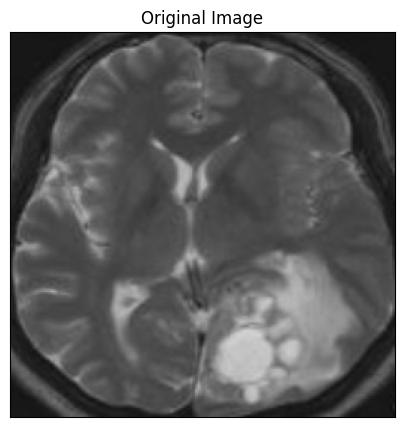

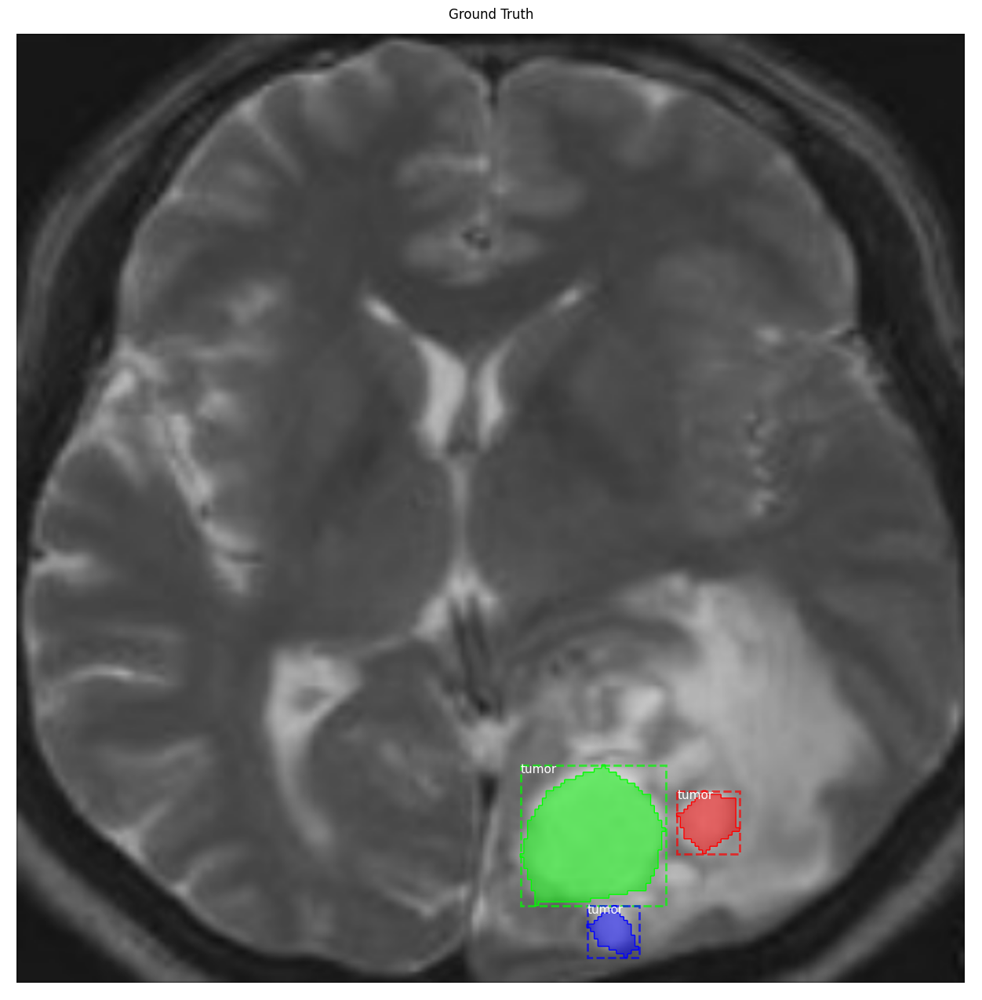

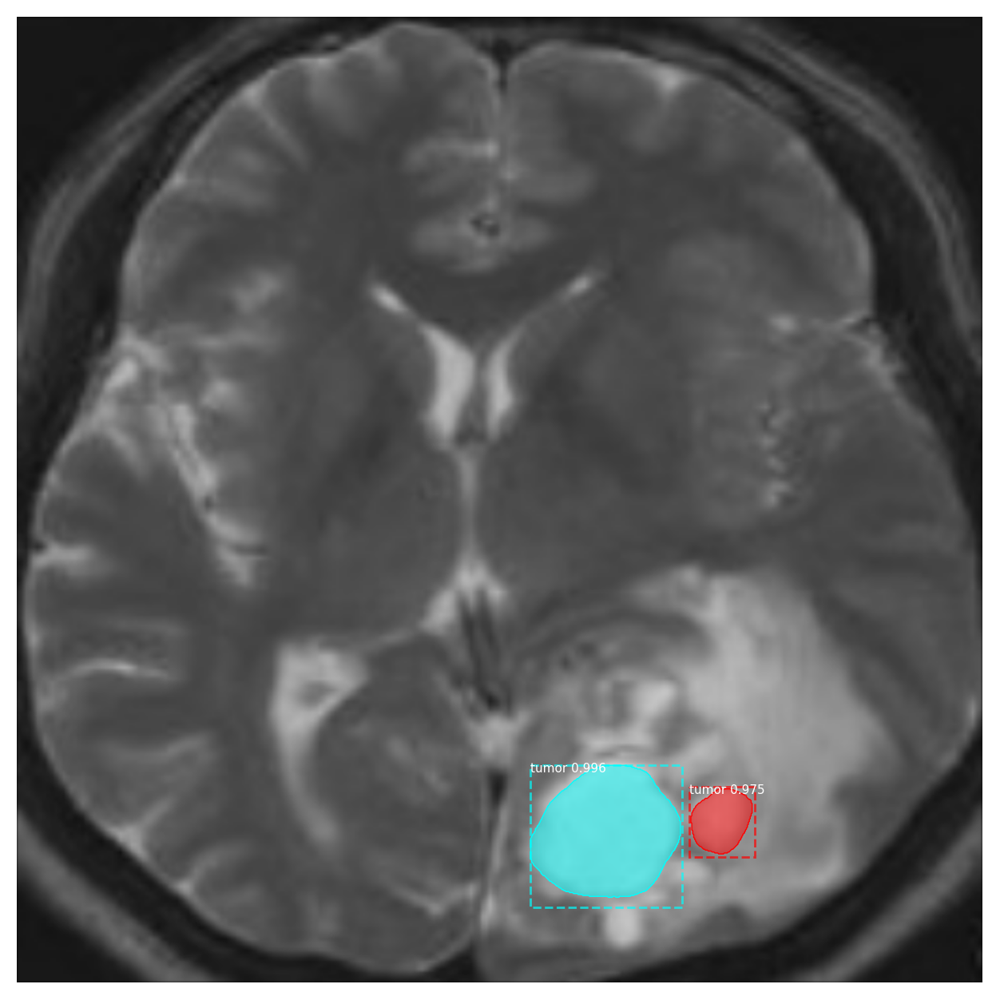

In [ ]:
# Evaluar y visualizar resultados
ind = 5 # aquí poner el número dentro del rango de las imagenes de evaluacion
display_image(dataset_val, ind)
display_real_annotations(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)

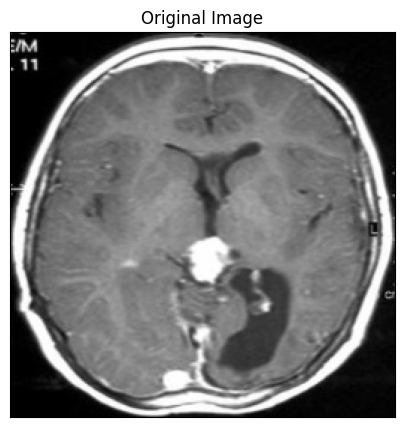

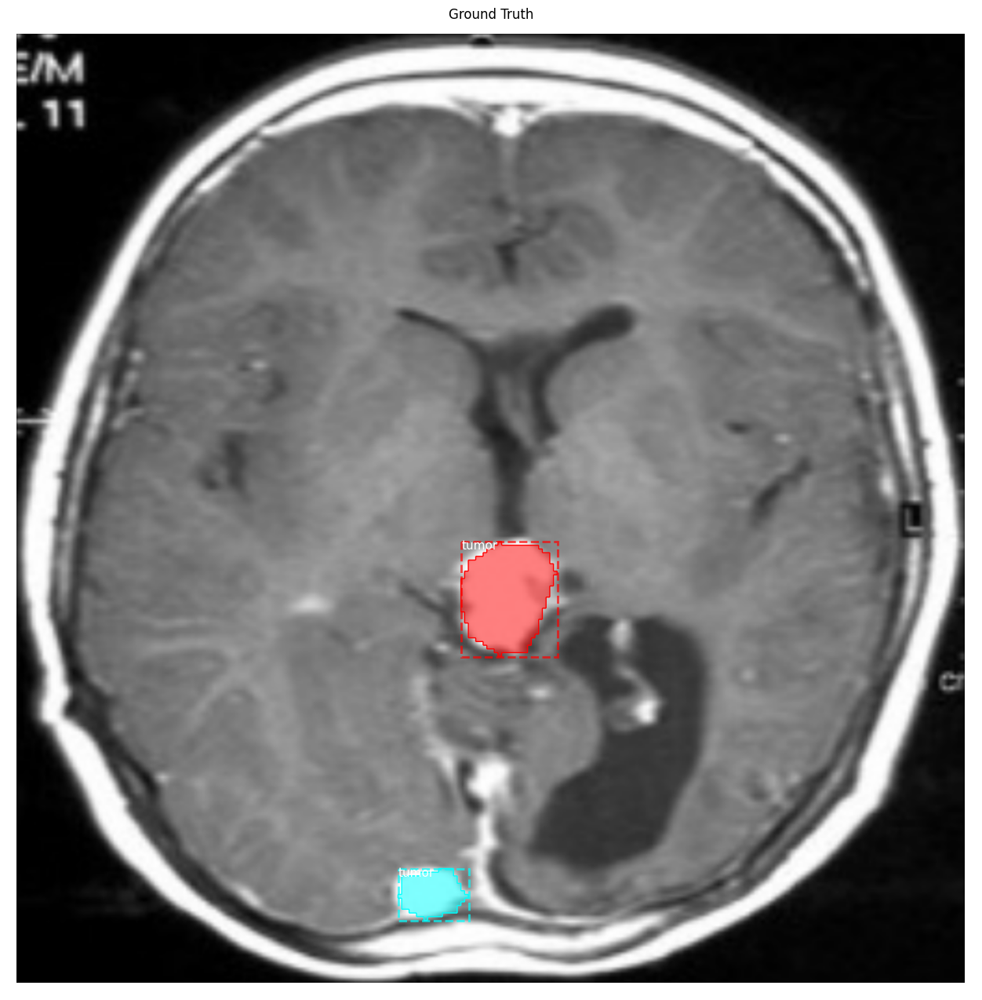

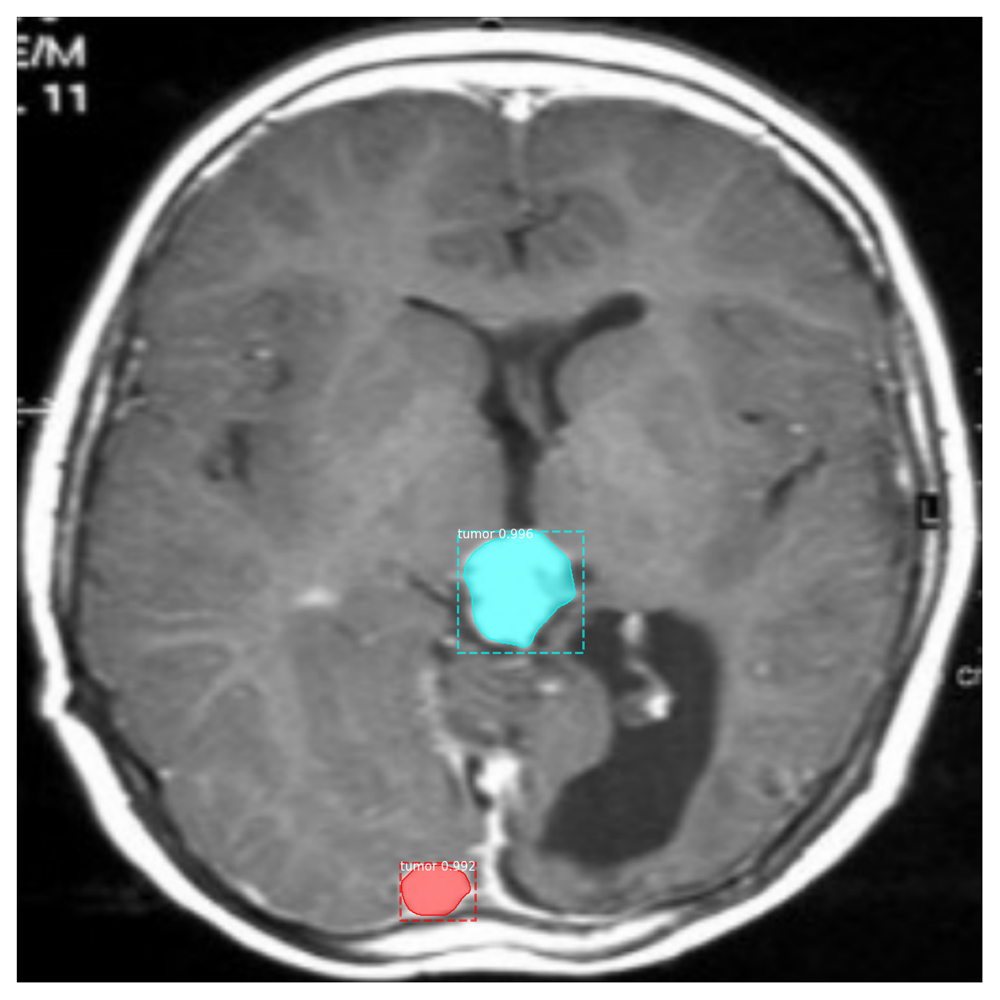

In [ ]:
# Evaluar y visualizar resultados
ind = 19 # aquí poner el número dentro del rango de las imagenes de evaluacion
display_image(dataset_val, ind)
display_real_annotations(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)

In [ ]:
print("Images: {}\nClasses: {}".format(len(dataset_test.image_ids), dataset_test.class_names))

Images: 4
Classes: ['BG', 'tumor']


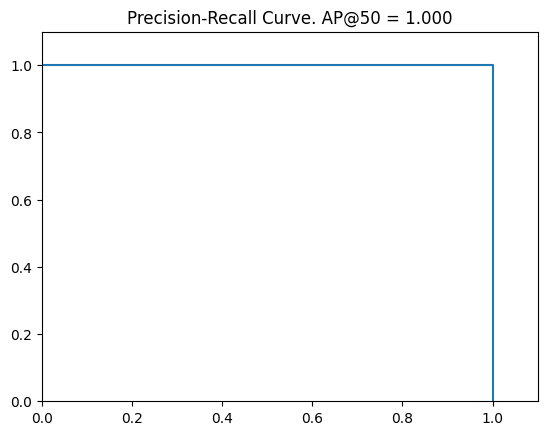


Imagen ID: 0
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.93148404]]
Scores: [0.9991941]
F1-Score: 1.0
IoU Promedio: 0.93148404


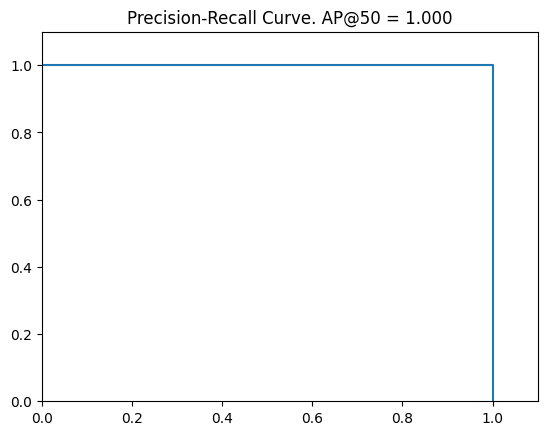


Imagen ID: 1
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.7673453]]
Scores: [0.996202]
F1-Score: 1.0
IoU Promedio: 0.7673453


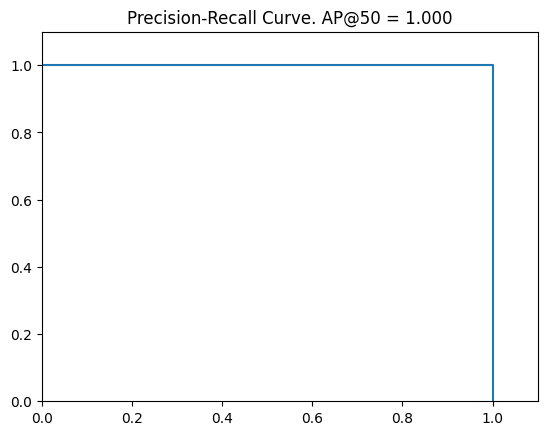


Imagen ID: 2
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.8097122]]
Scores: [0.9958521]
F1-Score: 1.0
IoU Promedio: 0.8097122


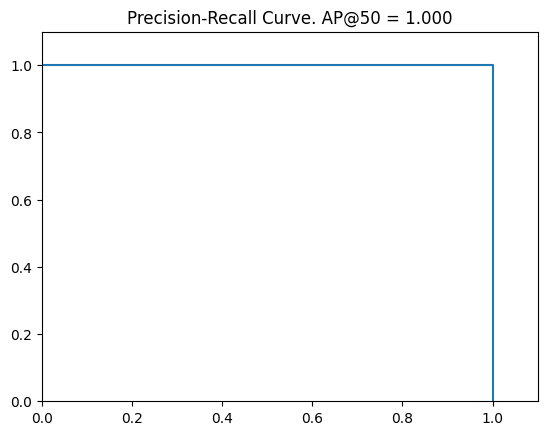


Imagen ID: 3
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.8023705]]
Scores: [0.99790215]
F1-Score: 1.0
IoU Promedio: 0.8023705

Promedios generales:
mAP @ IoU=50: 1.0
Precisión Promedio: 1.0
Recall Promedio: 1.0
F1-Score Promedio: 1.0
IoU Promedio General: 0.82772803


In [ ]:
def evaluate_image_metrics(dataset, model, config, image_id, curve_PR=False):
    """
    Calcula las métricas y muestra los resultados para una imagen específica.
    """
    # Cargar la imagen y las anotaciones de ground truth
    image, image_meta, gt_class_id, gt_bbox, gt_mask = \
        modellib.load_image_gt(dataset, config, image_id)

    # Realizar la predicción en la imagen usando el modelo
    results = model.detect([image], verbose=0)

    # Extraer las predicciones
    r = results[0]
    pred_class_id = r['class_ids']
    pred_bbox = r['rois']
    pred_mask = r['masks']
    pred_scores = r['scores']  # Puntuaciones de confianza

    # Calcular las métricas
    AP, precisions, recalls, overlaps = utils.compute_ap(
        gt_bbox, gt_class_id, gt_mask,
        pred_bbox, pred_class_id, pred_scores, pred_mask,
        iou_threshold=0.5)

    # Plot de la curva Precision-Recall
    if curve_PR:
        visualize.plot_precision_recall(AP, precisions, recalls)
        plt.show()  # Forzar la visualización del gráfico
        plt.close() # Cerrar la figura para liberar memoria

    # Quitar el primer y último valor de las listas de precisions y recalls
    precisions = precisions[1:-1]
    recalls = recalls[1:-1]

    # Calcular F1-Score y IoU promedio
    f1_score = calculate_f1_score(precisions, recalls)
    iou_avg = calculate_iou_average(overlaps)

    # Imprimir los resultados
    print(f"\nImagen ID: {image_id}")
    print("AP:", AP)
    print("Precisions:", precisions)
    print("Recalls:", recalls)
    print("Overlaps:", overlaps)
    print("Scores:", pred_scores)  # Imprime las puntuaciones de confianza
    print("F1-Score:", f1_score)  # Promedio del F1-Score
    print("IoU Promedio:", iou_avg)

    return AP, precisions, recalls, f1_score, iou_avg

# Iterar sobre todas las imágenes en el conjunto de datos
all_aps = []
all_precisions = []
all_recalls = []
all_f1_scores = []
all_iou_avgs = []

for image_id in range(len(dataset_test.image_ids)):
    AP, precisions, recalls,
    f1_score, iou_avg = evaluate_image_metrics(dataset_test,
                                               model, config, image_id, curve_PR=True)

    # Guardar los resultados en las listas
    all_aps.append(AP)
    all_precisions.append(np.mean(precisions))  # Promedio de precisiones para cada imagen
    all_recalls.append(np.mean(recalls))  # Promedio de recalls para cada imagen
    all_f1_scores.append(f1_score)
    all_iou_avgs.append(iou_avg)

# Calcular y mostrar el promedio de las métricas
print("\nPromedios generales:")
print("mAP @ IoU=50:", np.mean(all_aps))
print("Precisión Promedio:", np.mean(all_precisions))
print("Recall Promedio:", np.mean(all_recalls))
print("F1-Score Promedio:", np.mean(all_f1_scores))
print("IoU Promedio General:", np.mean(all_iou_avgs))



Imagen ID: 0
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.8858391]]
Scores: [0.99809724]
F1-Score: 1.0
IoU Promedio: 0.8858391

Imagen ID: 1
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.73270196]]
Scores: [0.98377615]
F1-Score: 1.0
IoU Promedio: 0.73270196

Imagen ID: 2
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.8652946]]
Scores: [0.9945531]
F1-Score: 1.0
IoU Promedio: 0.8652946


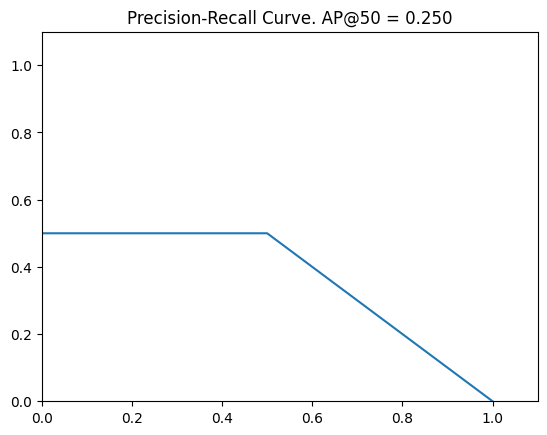


Imagen ID: 3
AP: 0.25
Precisions: [0.5 0.5]
Recalls: [0.  0.5]
Overlaps: [[0.2139002  0.4425637 ]
 [0.59704906 0.        ]]
Scores: [0.98706347 0.93199867]
F1-Score: 0.25
IoU Promedio: 0.31337824

Imagen ID: 4
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.8914561]]
Scores: [0.74396837]
F1-Score: 1.0
IoU Promedio: 0.8914561


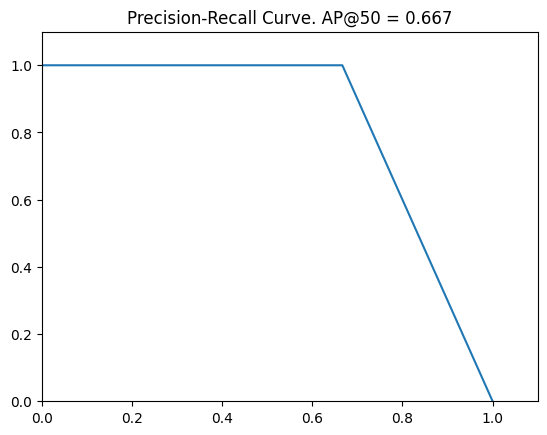


Imagen ID: 5
AP: 0.6666666865348816
Precisions: [1. 1.]
Recalls: [0.33333334 0.66666669]
Overlaps: [[0.8897092 0.        0.       ]
 [0.        0.7966151 0.       ]]
Scores: [0.99588674 0.97504854]
F1-Score: 0.6500000127404927
IoU Promedio: 0.28105405


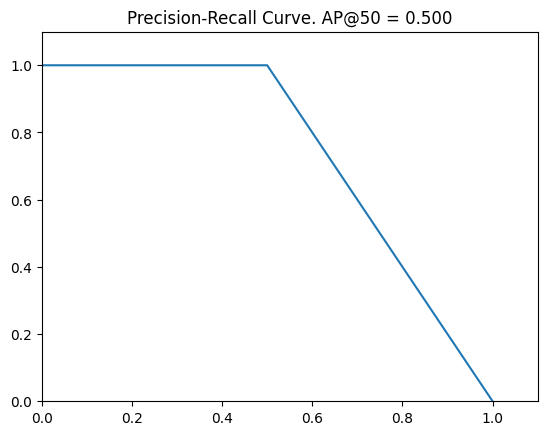


Imagen ID: 6
AP: 0.5
Precisions: [1.]
Recalls: [0.5]
Overlaps: [[0.       0.838451]]
Scores: [0.99472505]
F1-Score: 0.6666666666666666
IoU Promedio: 0.4192255

Imagen ID: 7
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.8752345]]
Scores: [0.99803513]
F1-Score: 1.0
IoU Promedio: 0.8752345


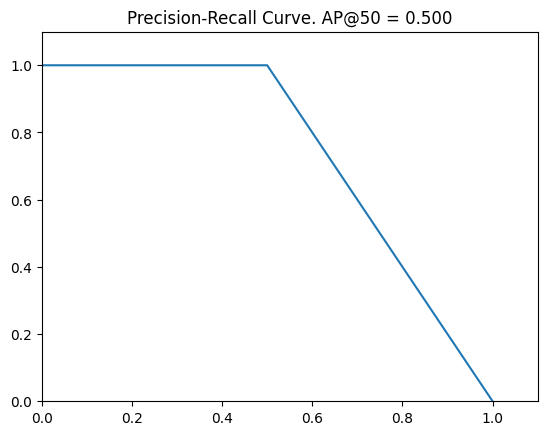


Imagen ID: 8
AP: 0.5
Precisions: [1.]
Recalls: [0.5]
Overlaps: [[0.81385255 0.04160833]]
Scores: [0.9961202]
F1-Score: 0.6666666666666666
IoU Promedio: 0.42773044


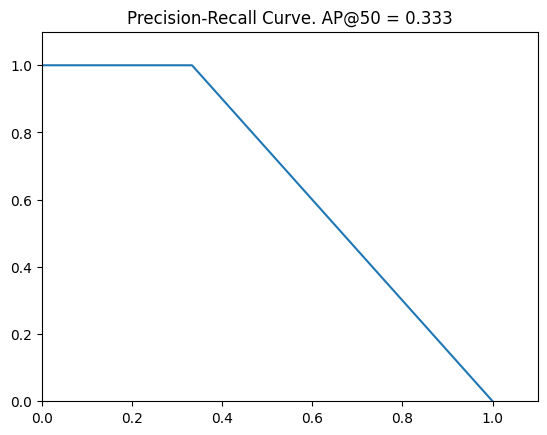


Imagen ID: 9
AP: 0.3333333432674408
Precisions: [1.]
Recalls: [0.33333334]
Overlaps: [[0.67737037 0.         0.        ]]
Scores: [0.779569]
F1-Score: 0.5000000111758708
IoU Promedio: 0.22579013

Imagen ID: 10
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.8186287]]
Scores: [0.9962534]
F1-Score: 1.0
IoU Promedio: 0.8186287


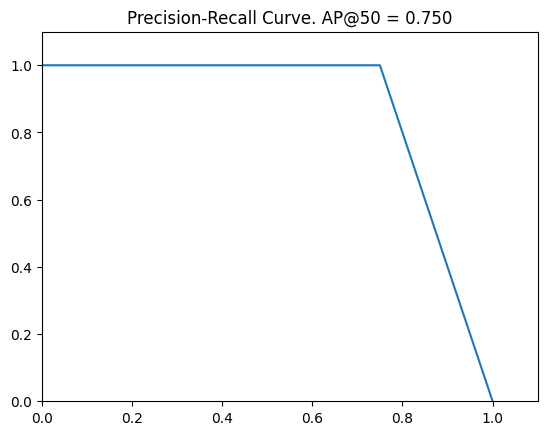


Imagen ID: 11
AP: 0.75
Precisions: [1. 1. 1.]
Recalls: [0.25 0.5  0.75]
Overlaps: [[0.85569555 0.         0.         0.        ]
 [0.         0.8747519  0.         0.        ]
 [0.         0.         0.83830124 0.0048    ]]
Scores: [0.9967     0.9950761  0.98599863]
F1-Score: 0.6412698412698412
IoU Promedio: 0.2144624


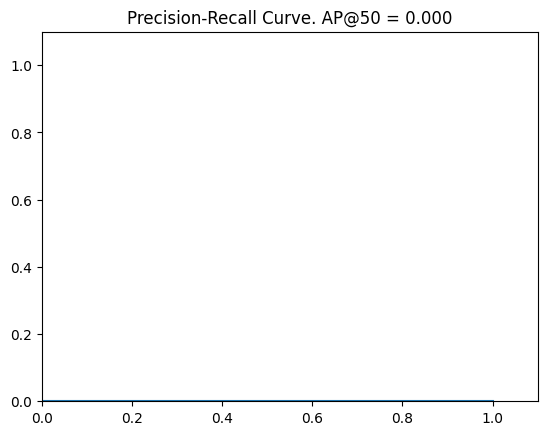

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)



Imagen ID: 12
AP: 0.0
Precisions: []
Recalls: []
Overlaps: []
Scores: []
F1-Score: nan
IoU Promedio: nan

Imagen ID: 13
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.87587523]]
Scores: [0.9962399]
F1-Score: 1.0
IoU Promedio: 0.87587523

Imagen ID: 14
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.89364266]]
Scores: [0.99098516]
F1-Score: 1.0
IoU Promedio: 0.89364266

Imagen ID: 15
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.8697214]]
Scores: [0.998621]
F1-Score: 1.0
IoU Promedio: 0.8697214

Imagen ID: 16
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.90985787]]
Scores: [0.9970702]
F1-Score: 1.0
IoU Promedio: 0.90985787

Imagen ID: 17
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.851804]]
Scores: [0.997759]
F1-Score: 1.0
IoU Promedio: 0.851804

Imagen ID: 18
AP: 1.0
Precisions: [1.]
Recalls: [1.]
Overlaps: [[0.8975331]]
Scores: [0.99882823]
F1-Score: 1.0
IoU Promedio: 0.8975331

Imagen ID: 19
AP: 1.0
Precisions: [1. 1.]
Recalls: [0.5 1. ]
Overlaps: [[

In [ ]:
def calculate_f1_score(precisions, recalls):
    """
    Calcula el F1-Score para cada par de precision y recall.
    Luego, retorna el promedio de los F1-Scores calculados.
    """
    f1_scores = []
    for p, r in zip(precisions, recalls):
        if p + r == 0:
            f1_scores.append(0.0)
        else:
            f1_score = 2 * (p * r) / (p + r)
            f1_scores.append(f1_score)

    return np.mean(f1_scores)

def calculate_iou_average(overlaps):
    """
    Calcula el IoU promedio a partir de la matriz de overlaps.
    """
    # Aplana la matriz y calcula el promedio
    return np.mean(overlaps)

def evaluate_image_metrics(dataset, model, config, image_id, curve_PR=False):
    """
    Calcula las métricas y muestra los resultados para una imagen específica.
    """
    # Cargar la imagen y las anotaciones de ground truth
    image, image_meta, gt_class_id, gt_bbox, gt_mask = \
        modellib.load_image_gt(dataset, config, image_id)

    # Realizar la predicción en la imagen usando el modelo
    results = model.detect([image], verbose=0)

    # Extraer las predicciones
    r = results[0]
    pred_class_id = r['class_ids']
    pred_bbox = r['rois']
    pred_mask = r['masks']
    pred_scores = r['scores']  # Puntuaciones de confianza

    # Calcular las métricas
    AP, precisions, recalls, overlaps = utils.compute_ap(
        gt_bbox, gt_class_id, gt_mask,
        pred_bbox, pred_class_id, pred_scores, pred_mask,
        iou_threshold=0.5)

    # Plot de la curva Precision-Recall
    if curve_PR and AP < 1:
        visualize.plot_precision_recall(AP, precisions, recalls)
        plt.show()  # Forzar la visualización del gráfico
        plt.close() # Cerrar la figura para liberar memoria

    # Quitar el primer y último valor de las listas de precisions y recalls
    precisions = precisions[1:-1]
    recalls = recalls[1:-1]

    # Calcular F1-Score y IoU promedio
    f1_score = calculate_f1_score(precisions, recalls)
    iou_avg = calculate_iou_average(overlaps)

    # Imprimir los resultados
    print(f"\nImagen ID: {image_id}")
    print("AP:", AP)
    print("Precisions:", precisions)
    print("Recalls:", recalls)
    print("Overlaps:", overlaps)
    print("Scores:", pred_scores)  # Imprime las puntuaciones de confianza
    print("F1-Score:", f1_score)  # Promedio del F1-Score
    print("IoU Promedio:", iou_avg)

    return AP, precisions, recalls, f1_score, iou_avg

# Iterar sobre todas las imágenes en el conjunto de datos
all_aps = []
all_precisions = []
all_recalls = []
all_f1_scores = []
all_iou_avgs = []

for image_id in range(len(dataset_val.image_ids)):
    AP, precisions, recalls, f1_score, iou_avg = evaluate_image_metrics(dataset_val, model, config, image_id, curve_PR=True)

    # Guardar los resultados en las listas
    all_aps.append(AP)
    all_precisions.append(np.mean(precisions))  # Promedio de precisiones para cada imagen
    all_recalls.append(np.mean(recalls))  # Promedio de recalls para cada imagen
    all_f1_scores.append(f1_score)
    all_iou_avgs.append(iou_avg)

# Calcular y mostrar el promedio de las métricas
print("\nPromedios generales:")
print("mAP @ IoU=50:", np.mean(all_aps))
print("Precisión Promedio:", np.mean(all_precisions))
print("Recall Promedio:", np.mean(all_recalls))
print("F1-Score Promedio:", np.mean(all_f1_scores))
print("IoU Promedio General:", np.mean(all_iou_avgs))


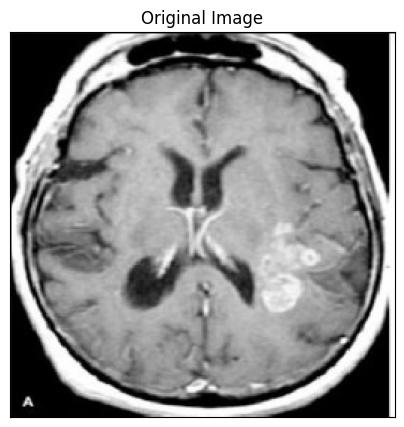

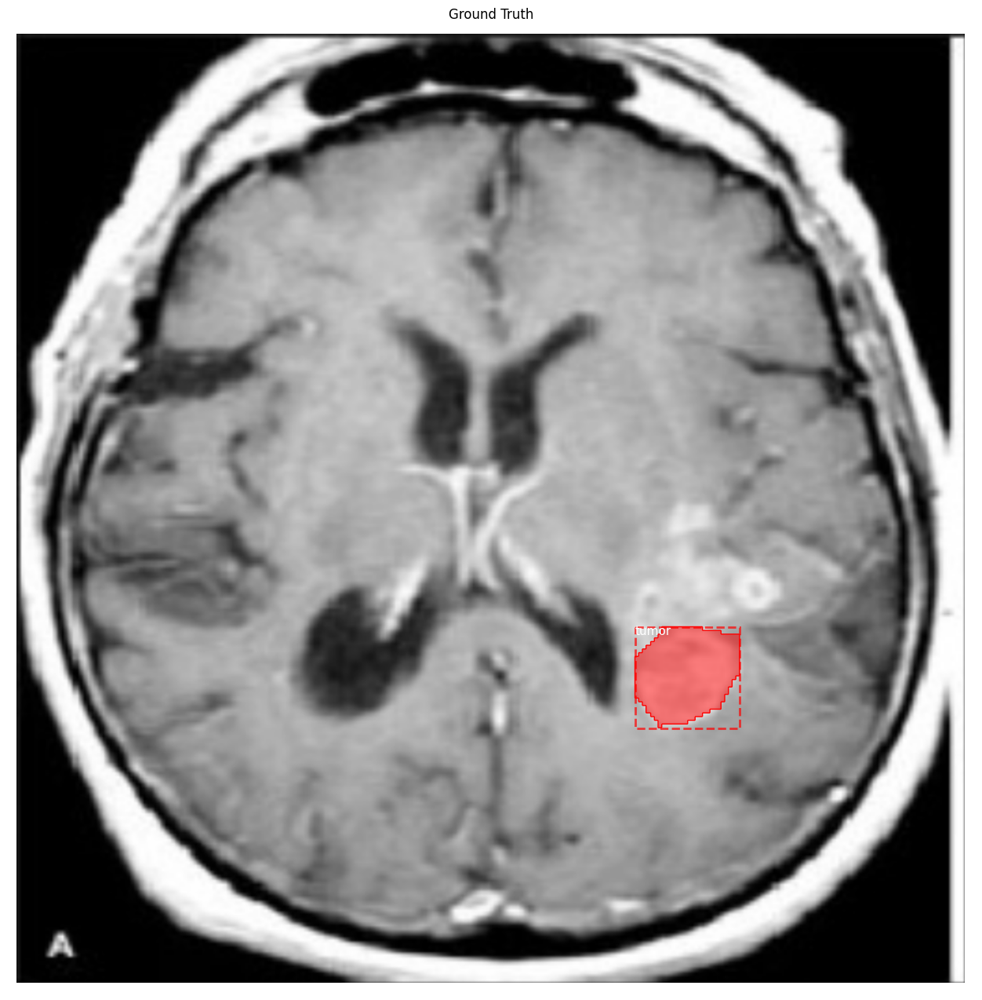


*** No instances to display *** 



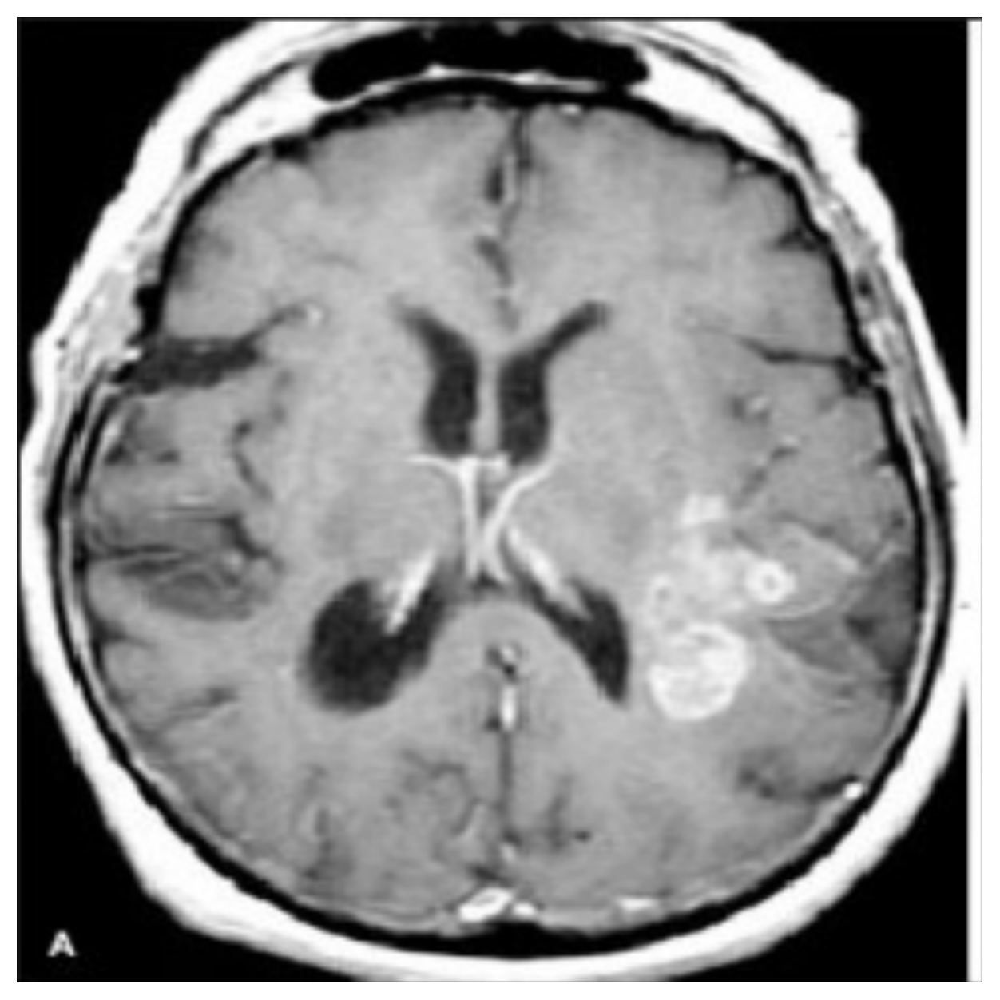

In [ ]:
# Evaluar y visualizar resultados
ind = 12 # aquí poner el número dentro del rango de las imagenes de evaluacion
display_image(dataset_val, ind)
display_real_annotations(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)

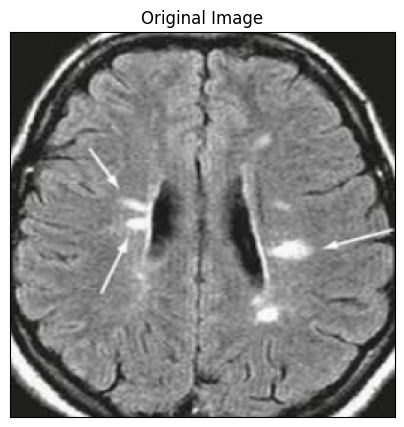

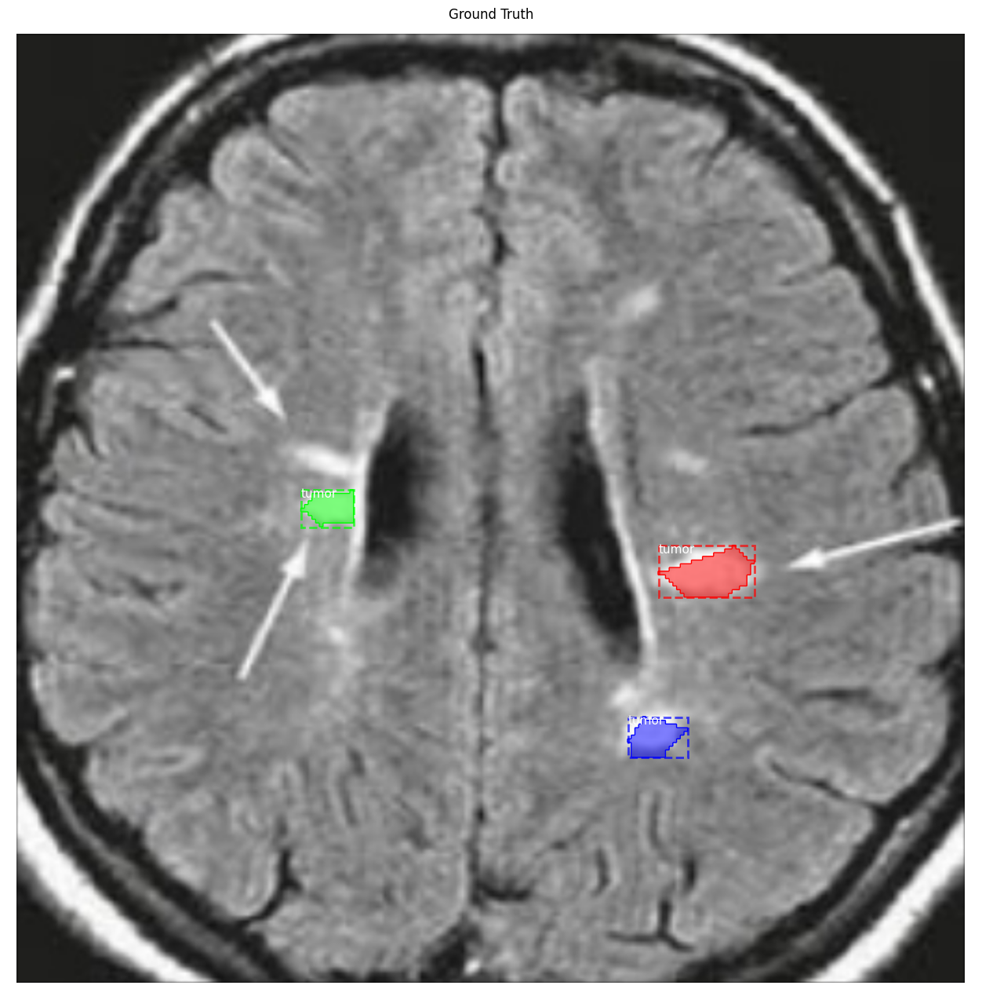

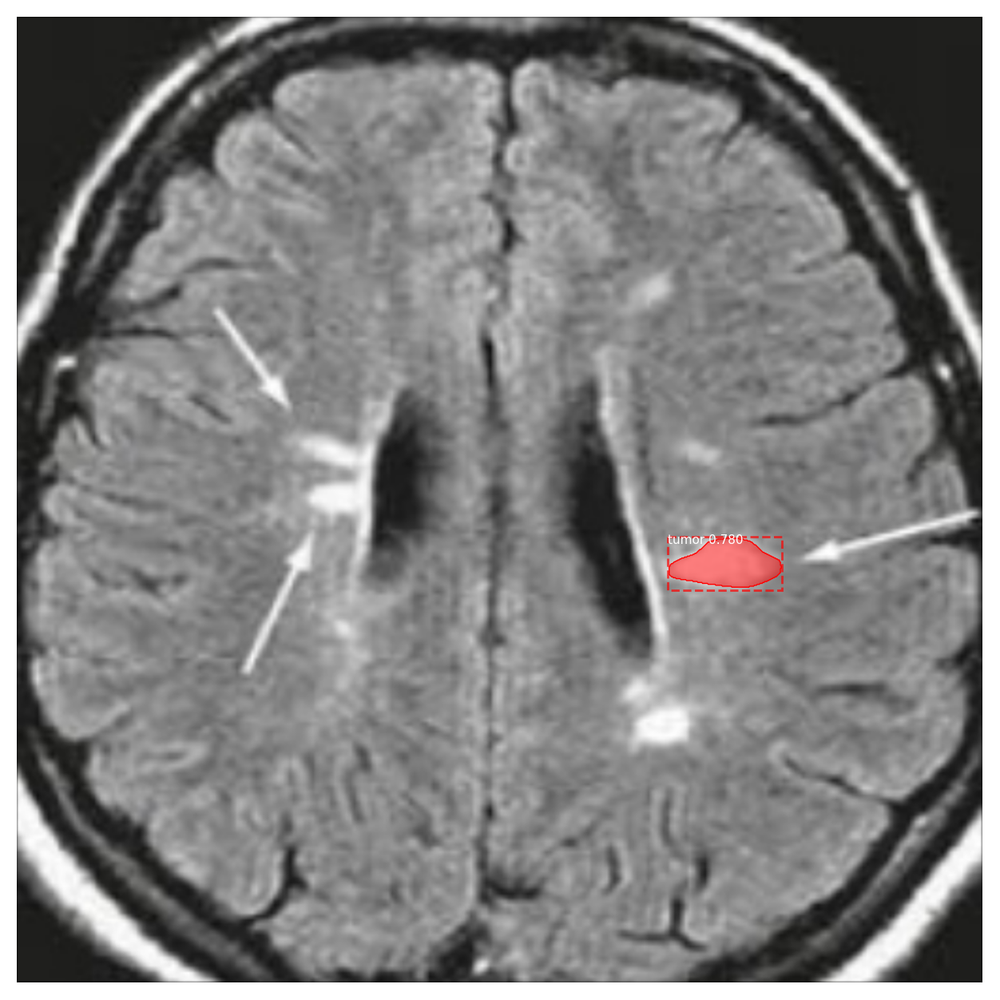

In [ ]:
# Evaluar y visualizar resultados
ind = 9 # aquí poner el número dentro del rango de las imagenes de evaluacion
display_image(dataset_val, ind)
display_real_annotations(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)